In [1]:
import pandas as pd
import numpy as np

In [2]:
#pull in df from transcript_nlp notebook, features
%store -r sorted_df

In [3]:
sorted_df

,url,data,datetag,ticker,nparts,date,QA,MP,mp_word_count,qa_word_count,...,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len,clean_mp,clean_qa
1,/article/6120-netflix-q4-2005-earnings-confere...,"<div class=""sa-art article-width"" id=""a-body"" ...",Netflix (NASDAQ:NFLX) Q4 2005 Earnings Confere...,NFLX,2,"January 24, 2006","will be conducted electronically, if you'd li...",netflix (nasdaq:nflx) q4 2005 earnings confere...,4160,6187,...,22,0.003556,6433,1.546394,8922,1.442056,4.863394,4.428483,netflix nasdaq nflx q earnings conference call...,conducted electronically like ask question ple...
18,/article/9428-netflix-inc-q1-2006-earnings-con...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2006 Earnings...",NFLX,6,"April 24, 2006",""">question-and-answer sessionoperatorthank you...","netflix, inc. (nasdaq:nflx) q1 2006 earnings...",3789,2838,...,3,0.001057,5871,1.549485,4080,1.437632,5.120595,4.829699,netflix inc nasdaq nflx q earnings conference ...,question answer sessionoperatorthank today que...
7,/article/14197-netflix-q2-2006-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...",To sponsor a Seeking Alpha transcript click he...,NFLX,4,"July 24, 2006",""">question-and-answer sessionoperatorour first...",to sponsor a seeking alpha transcript click he...,3690,4656,...,7,0.001503,5646,1.530081,7027,1.509235,4.876891,4.758868,sponsor seeking alpha transcript click july pm...,question answer sessionoperatorour first quest...
8,/article/116612-netflix-inc-q4-2008-earnings-c...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q4 2008 Earnings C...",NFLX,5,"January 26, 2009",""">question-and-answer sessionoperator(operator...","netflix, inc. (nasdaq:nflx) q4 2008 earnings c...",3267,3751,...,11,0.002933,5183,1.586471,5682,1.514796,5.003272,4.853994,netflix inc nasdaq nflx q earnings call januar...,question answer sessionoperator operator instr...
46,/article/3995-full-transcript-of-netflix-s-3q0...,"<div class=""sa-art article-width"" id=""a-body"" ...",Here’s the entire text of the prepared remarks...,NFLX,1,"October 19, 2005",,here’s the entire text of the prepared remarks...,3261,0,...,0,NaN,4952,1.518553,0,NaN,4.749926,0.000000,entire text prepared remarks netflix ticker nf...,
4,/article/25033-netflix-q4-2006-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...",To sponsor a Seeking Alpha transcript click he...,NFLX,5,"January 24, 2007",""">question-and-answer sessionoperator(operator...",to sponsor a seeking alpha transcript click he...,3149,5232,...,10,0.001911,4783,1.518895,7555,1.443998,5.036160,4.844205,sponsor seeking alpha transcript click january...,question answer sessionoperator operator instr...
53,/article/168407-netflix-inc-q3-2009-earnings-c...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q3 2009 Earnings C...",NFLX,3,"October 22, 2009",""">question-and-answer sessiondeborah crawfordt...","netflix, inc. (nasdaq:nflx) q3 2009 earnings c...",3117,4591,...,5,0.001089,4684,1.502727,6803,1.481812,5.005767,4.971914,netflix inc nasdaq nflx q earnings call transc...,question answer sessiondeborah crawfordthanks ...
17,/article/132974-netflix-inc-q1-2009-earnings-c...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2009 Earnings C...",NFLX,5,"April 23, 2008",""">question-and-answer sessiondeborah t. crawfo...","netflix, inc. (nasdaq:nflx) q1 2009 earnings c...",2995,4563,...,3,0.000657,4568,1.525209,6731,1.475126,5.054949,4.879784,netflix inc nasdaq nflx q earnings call april ...,question answer sessiondeborah crawfordgreat f...
29,/article/32729-netflix-q1-2007-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...",To sponsor a Seeking Alpha transcript click he...,NFLX,3,"April 18, 2007",""">question-and-answer sessionoperatorwe will t...",to sp

In [15]:
#change date string to date format that can sort by 
import datetime
import pandas as pd
import holidays
from datetime import timedelta, date
from bdateutil import isbday, relativedelta
def convert_date_string(row):
    import datetime
    start = row['date']
    start_date = datetime.datetime.strptime(str(start), '%B %d, %Y').date()#parse the date's original format
    if isbday(start_date, holidays=holidays.US())==True:#if it is a biz day and not holiday, use it
        start_date
    else:#this will take date input and add to the next biz day (non-weekend), taking into account US holidays...
        start_date=(datetime.datetime.strptime(str(start_date),'%Y-%m-%d')+ relativedelta(bdays=+1, holidays=holidays.US()))
    return pd.Series(start_date.strftime('%Y-%m-%d'))#format it this way
sorted_df['date'] = sorted_df.apply(convert_date_string, axis=1)
sorted_df

,url,data,datetag,ticker,nparts,date,QA,MP,mp_word_count,qa_word_count,...,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len,clean_mp,clean_qa
20,/article/3073526-netflixs-nflx-ceo-reed-hastin...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2015 Results Ea...",NFLX,3,2015-04-15,""">question-and-answer sessionq -mark mahaneyok...","netflix, inc. (nasdaq:nflx) q1 2015 results ea...",98,7232,...,18,0.002489,164,1.673469,10120,1.399336,5.576923,4.622511,netflix inc nasdaq nflx q results earnings con...,question answer sessionq mark mahaneyokay than...
21,/article/4163354-netflixs-nflx-ceo-wilmot-hast...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2018 Earnings C...",NFLX,3,2018-04-16,""">question-and-answer sessionq - benjamin swin...","netflix, inc. (nasdaq:nflx) q1 2018 earnings c...",115,6331,...,26,0.004107,207,1.800000,9011,1.423314,5.624000,4.731402,netflix inc nasdaq nflx q earnings conference ...,question answer sessionq benjamin swinburnetha...
48,/article/4062901-netflixs-nflx-ceo-reed-hastin...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2017 Earnings C...",NFLX,3,2017-04-17,""">question-and-answer sessionq - doug mitchels...","netflix, inc. (nasdaq:nflx) q1 2017 earnings c...",103,6523,...,33,0.005059,181,1.757282,9385,1.438755,5.554545,4.771341,netflix inc nasdaq nflx q earnings conference ...,question answer sessionq doug mitchelsonthanks...
29,/article/32729-netflix-q1-2007-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...",To sponsor a Seeking Alpha transcript click he...,NFLX,3,2007-04-18,""">question-and-answer sessionoperatorwe will t...",to sponsor a seeking alpha transcript click he...,2968,3696,...,10,0.002706,4427,1.491577,5378,1.455087,4.983034,4.808733,sponsor seeking alpha transcript click april e...,question answer sessionoperatorwe take first q...
35,/article/3966087-netflix-nflx-wilmot-reed-hast...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2016 Earnings C...",NFLX,3,2016-04-18,""">question-and-answer sessionbenjamin daniel s...","netflix, inc. (nasdaq:nflx) q1 2016 earnings c...",110,8707,...,28,0.003216,185,1.681818,12464,1.431492,5.338983,4.729413,netflix inc nasdaq nflx q earnings call april ...,question answer sessionbenjamin daniel swinbur...
40,/article/73207-netflix-q1-2008-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2008 Earnings C...",NFLX,5,2008-04-21,""">question-and-answer sessionoperator(operator...","netflix, inc. (nasdaq:nflx) q1 2008 earnings c...",2719,3673,...,1,0.000272,4104,1.509378,5422,1.476178,4.994892,4.881479,netflix inc nasdaq nflx q earnings call april ...,question answer sessionoperator operator instr...
10,/article/200102-netflix-inc-q1-2010-earnings-c...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2010 Earnings C...",NFLX,2,2010-04-21,deborah crawford the first question comes fro...,"netflix, inc. (nasdaq:nflx) q1 2010 earnings c...",473,6035,...,11,0.001823,799,1.689218,9073,1.503397,5.208748,4.671488,netflix inc nasdaq nflx q earnings call april ...,deborah crawford first question comes line ste...
51,/article/2152493-netflixs-ceo-discusses-q1-201...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2014 Results Ea...",NFLX,3,2014-04-21,""">question-and-answer sessionrich greenfield -...","netflix, inc. (nasdaq:nflx) q1 2014 results ea...",120,7287,...,19,0.002607,212,1.766667,10137,1.391107,5.543307,4.592552,netflix inc nasdaq nflx q results earnings con...,question answer sessionrich greenfield btig re...
26,/article/1360041-netflixs-ceo-discusses-q1-201...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2013 Earnings C...",NFLX,5,2

In [4]:
#sort by date
sorted_df = sorted_df.sort_values("date", na_position='first',ascending=True)
sorted_df

,url,data,datetag,ticker,nparts,date,QA,MP,mp_word_count,qa_word_count,...,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len,clean_mp,clean_qa
20,/article/3073526-netflixs-nflx-ceo-reed-hastin...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2015 Results Ea...",NFLX,3,"April 15, 2015",""">question-and-answer sessionq -mark mahaneyok...","netflix, inc. (nasdaq:nflx) q1 2015 results ea...",98,7232,...,18,0.002489,164,1.673469,10120,1.399336,5.576923,4.622511,netflix inc nasdaq nflx q results earnings con...,question answer sessionq mark mahaneyokay than...
21,/article/4163354-netflixs-nflx-ceo-wilmot-hast...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2018 Earnings C...",NFLX,3,"April 16, 2018",""">question-and-answer sessionq - benjamin swin...","netflix, inc. (nasdaq:nflx) q1 2018 earnings c...",115,6331,...,26,0.004107,207,1.800000,9011,1.423314,5.624000,4.731402,netflix inc nasdaq nflx q earnings conference ...,question answer sessionq benjamin swinburnetha...
48,/article/4062901-netflixs-nflx-ceo-reed-hastin...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2017 Earnings C...",NFLX,3,"April 17, 2017",""">question-and-answer sessionq - doug mitchels...","netflix, inc. (nasdaq:nflx) q1 2017 earnings c...",103,6523,...,33,0.005059,181,1.757282,9385,1.438755,5.554545,4.771341,netflix inc nasdaq nflx q earnings conference ...,question answer sessionq doug mitchelsonthanks...
29,/article/32729-netflix-q1-2007-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...",To sponsor a Seeking Alpha transcript click he...,NFLX,3,"April 18, 2007",""">question-and-answer sessionoperatorwe will t...",to sponsor a seeking alpha transcript click he...,2968,3696,...,10,0.002706,4427,1.491577,5378,1.455087,4.983034,4.808733,sponsor seeking alpha transcript click april e...,question answer sessionoperatorwe take first q...
35,/article/3966087-netflix-nflx-wilmot-reed-hast...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2016 Earnings C...",NFLX,3,"April 18, 2016",""">question-and-answer sessionbenjamin daniel s...","netflix, inc. (nasdaq:nflx) q1 2016 earnings c...",110,8707,...,28,0.003216,185,1.681818,12464,1.431492,5.338983,4.729413,netflix inc nasdaq nflx q earnings call april ...,question answer sessionbenjamin daniel swinbur...
40,/article/73207-netflix-q1-2008-earnings-call-t...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2008 Earnings C...",NFLX,5,"April 21, 2008",""">question-and-answer sessionoperator(operator...","netflix, inc. (nasdaq:nflx) q1 2008 earnings c...",2719,3673,...,1,0.000272,4104,1.509378,5422,1.476178,4.994892,4.881479,netflix inc nasdaq nflx q earnings call april ...,question answer sessionoperator operator instr...
10,/article/200102-netflix-inc-q1-2010-earnings-c...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2010 Earnings C...",NFLX,2,"April 21, 2010",deborah crawford the first question comes fro...,"netflix, inc. (nasdaq:nflx) q1 2010 earnings c...",473,6035,...,11,0.001823,799,1.689218,9073,1.503397,5.208748,4.671488,netflix inc nasdaq nflx q earnings call april ...,deborah crawford first question comes line ste...
51,/article/2152493-netflixs-ceo-discusses-q1-201...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, Inc. (NASDAQ:NFLX) Q1 2014 Results Ea...",NFLX,3,"April 21, 2014",""">question-and-answer sessionrich greenfield -...","netflix, inc. (nasdaq:nflx) q1 2014 results ea...",120,7287,...,19,0.002607,212,1.766667,10137,1.391107,5.543307,4.592552,netflix inc nasdaq nflx q results earnings con...,question answer sessionrich greenfield btig re...
26,/article/1360041-netflixs-ceo-discusses-q1-201...,"<div class=""sa-art article-width"" id=""a-body"" ...","Netflix, In

In [9]:
#pull in df from transcript_nlp notebook, target variables
%store -r df_excess_returns

In [10]:
#rename 'date_string' to 'date', so can merge on it with other dataframe
df_excess_returns=df_excess_returns.rename(index=str, columns={'date_string':'date'})
df_excess_returns


,date,excess_return_1,excess_return_30,excess_return_60,excess_return_90,excess_return_180,excess_sign_plus180,excess_sign_plus90,excess_sign_plus60,excess_sign_plus30,excess_sign_plus1
0,2006-01-24,0.1547,0.0192,0.1403,0.2282,-0.0369,0,1,1,1,1
1,2006-04-24,0.0182,-0.0694,-0.0754,-0.2035,-0.3113,0,0,0,0,1
2,2006-07-24,-0.2132,-0.2419,-0.0733,-0.1178,-0.2064,0,0,0,0,0
3,2009-01-26,0.1447,0.2685,0.3408,0.5122,0.2078,1,1,1,1,1
4,2005-10-19,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441,0,0,0,0,0
5,2007-01-24,0.0337,0.0249,0.0276,-0.0787,-0.3105,0,0,1,1,1
6,2009-10-22,0.1174,0.2030,0.0689,-0.0093,0.6488,1,0,1,1,1
7,2008-04-23,0.0519,-0.0010,-0.0073,-0.0548,0.0439,1,0,0,0,1
8,2007-04-18,-0.0085,-0.0252,-0.1156,-0.1195,0.0515,1,0,0,0,0
9,2008-01-23,-0.0850,0.1569,0.6001,0.2321,0.2094,1,1,1,1,0


In [11]:
#check out all the column headers
list(sorted_df)

['url',
 'data',
 'datetag',
 'ticker',
 'nparts',
 'date',
 'QA',
 'MP',
 'mp_word_count',
 'qa_word_count',
 'mp_coleman',
 'mp_flesch',
 'mp_smog',
 'mp_kincaid',
 'mp_automated',
 'mp_dale_chall',
 'mp_diff_words',
 'mp_linsear',
 'mp_gunning',
 'qa_coleman',
 'qa_flesch',
 'qa_smog',
 'qa_kincaid',
 'qa_automated',
 'qa_dale_chall',
 'qa_diff_words',
 'qa_linsear',
 'qa_gunning',
 'mp_compound',
 'mp_neg',
 'mp_neu',
 'mp_pos',
 'qa_compound',
 'qa_neg',
 'qa_neu',
 'qa_pos',
 'mp_txt_blob_sent_pol',
 'mp_txt_blob_sent_subj',
 'qa_txt_blob_sent_pol',
 'qa_txt_blob_sent_subj',
 'mp_numerics',
 'mp_num_ratio',
 'qa_numerics',
 'qa_num_ratio',
 'mp_syllable',
 'mp_syll_ratio',
 'qa_syllable',
 'qa_syll_ratio',
 'mp_avg_word_len',
 'qa_avg_word_len',
 'clean_mp',
 'clean_qa']

In [16]:
#merge the dataframes on 'date', make it the index, drop duplicates, keep only desired columns, 
new_df=df_excess_returns.set_index('date').join(sorted_df.set_index('date'))
newer_df=new_df.drop_duplicates()
clean_df=newer_df.drop(['url', 'data', 'datetag', 'ticker', 'nparts', 'QA','MP', 'clean_mp', 'clean_qa', 'excess_sign_plus180', 'excess_sign_plus90', 'excess_sign_plus60', 'excess_sign_plus30', 'excess_sign_plus1'], axis=1)
clean_df

,excess_return_1,excess_return_30,excess_return_60,excess_return_90,excess_return_180,mp_word_count,qa_word_count,mp_coleman,mp_flesch,mp_smog,...,mp_numerics,mp_num_ratio,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441,73,5618,14.12,-2.63,0.0,...,1,0.013699,15,0.002670,114,1.561644,8048,1.432538,5.135135,4.457613
2005-10-19,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441,3261,0,12.85,-3229.99,0.0,...,23,0.007053,0,NaN,4952,1.518553,0,NaN,4.749926,0.000000
2006-01-24,0.1547,0.0192,0.1403,0.2282,-0.0369,4160,6187,13.49,-4142.47,0.0,...,50,0.012019,22,0.003556,6433,1.546394,8922,1.442056,4.863394,4.428483
2006-04-24,0.0182,-0.0694,-0.0754,-0.2035,-0.3113,3789,2838,14.24,-3765.91,0.0,...,17,0.004487,3,0.001057,5871,1.549485,4080,1.437632,5.120595,4.829699
2006-07-24,-0.2132,-0.2419,-0.0733,-0.1178,-0.2064,3690,4656,13.61,-3665.42,0.0,...,22,0.005962,7,0.001503,5646,1.530081,7027,1.509235,4.876891,4.758868
2006-10-23,0.1829,0.2570,0.1113,-0.0868,-0.1355,2807,4361,14.13,-2769.18,0.0,...,16,0.005700,9,0.002064,4302,1.532597,6232,1.429030,5.085734,4.709357
2007-01-24,0.0337,0.0249,0.0276,-0.0787,-0.3105,3149,5232,13.95,-3116.31,0.0,...,31,0.009844,10,0.001911,4783,1.518895,7555,1.443998,5.036160,4.844205
2007-04-18,-0.0085,-0.0252,-0.1156,-0.1195,0.0515,2968,3696,13.49,-2932.59,0.0,...,16,0.005391,10,0.002706,4427,1.491577,5378,1.455087,4.983034,4.808733
2007-07-23,-0.0522,0.0568,0.1242,0.3547,0.4382,2656,5432,14.30,-2615.91,0.0,...,12,0.004518,12,0.002209,4110,1.547440,7653,1.408873,5.118411,4.671522


In [63]:
clean_df.columns, len(clean_df)

(Index(['excess_return_1', 'excess_return_30', 'excess_return_60',
        'excess_return_90', 'excess_return_180', 'mp_word_count',
        'qa_word_count', 'mp_coleman', 'mp_flesch', 'mp_smog', 'mp_kincaid',
        'mp_automated', 'mp_dale_chall', 'mp_diff_words', 'mp_linsear',
        'mp_gunning', 'qa_coleman', 'qa_flesch', 'qa_smog', 'qa_kincaid',
        'qa_automated', 'qa_dale_chall', 'qa_diff_words', 'qa_linsear',
        'qa_gunning', 'mp_compound', 'mp_neg', 'mp_neu', 'mp_pos',
        'qa_compound', 'qa_neg', 'qa_neu', 'qa_pos', 'mp_txt_blob_sent_pol',
        'mp_txt_blob_sent_subj', 'qa_txt_blob_sent_pol',
        'qa_txt_blob_sent_subj', 'mp_numerics', 'mp_num_ratio', 'qa_numerics',
        'qa_num_ratio', 'mp_syllable', 'mp_syll_ratio', 'qa_syllable',
        'qa_syll_ratio', 'mp_avg_word_len', 'qa_avg_word_len'],
       dtype='object'), 54)

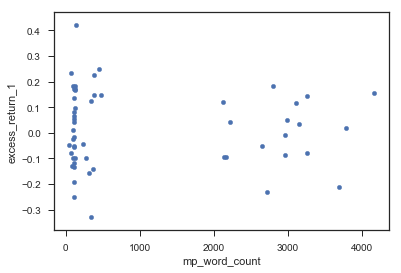

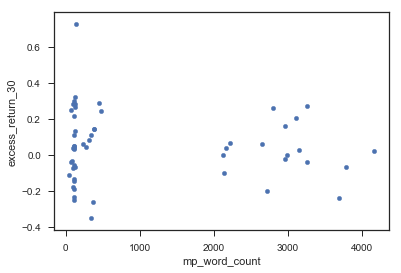

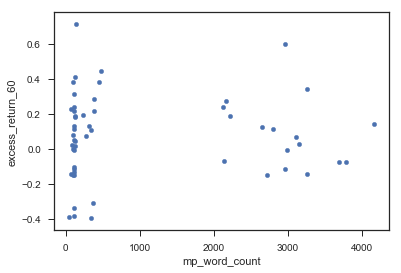

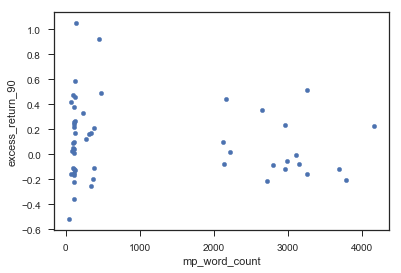

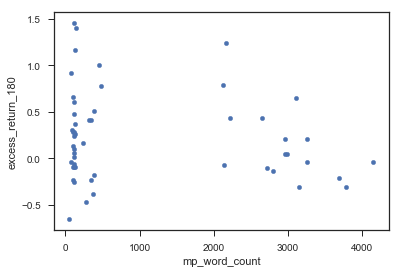

...

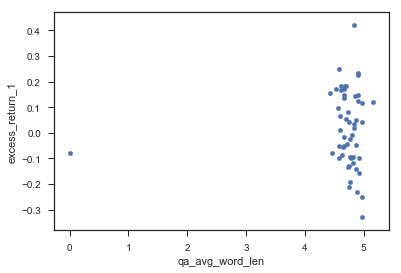

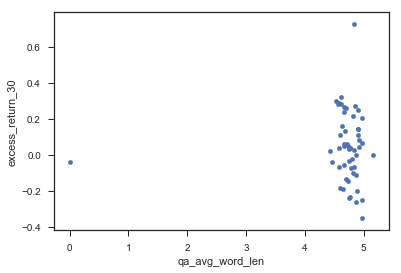

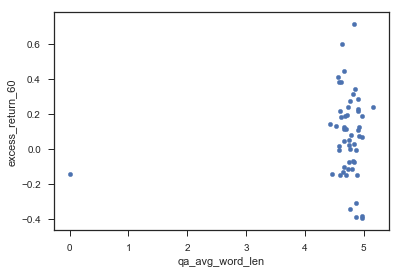

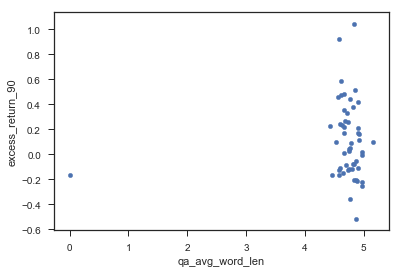

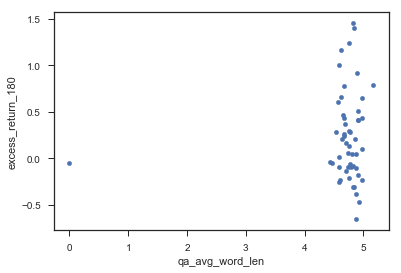

In [155]:
#starting after the first 5 columns(the returns) for the x variable; using only first 5 columns for y variable
for column in list(clean_df.columns[5:]):
    for col2 in list(clean_df.columns[:5]):
        clean_df.plot(kind='scatter', x=column, y=col2)
        plt.show()

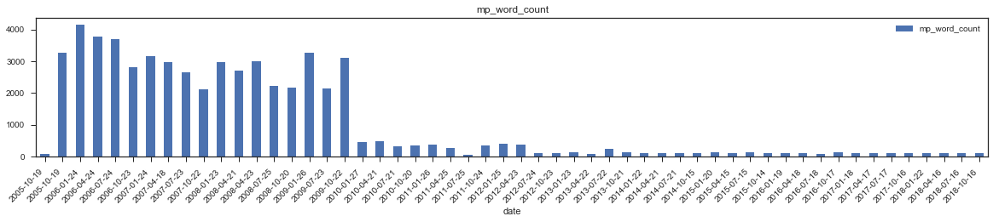

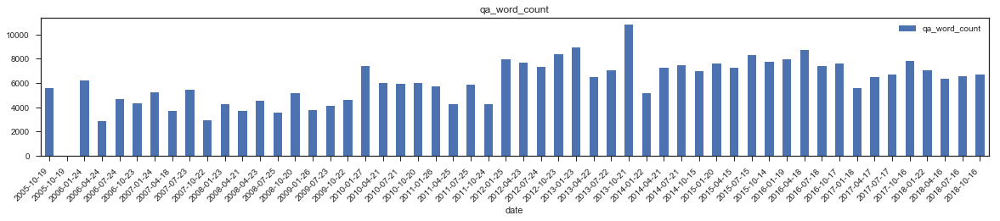

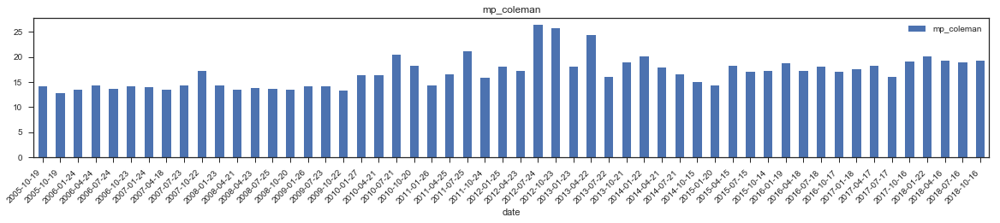

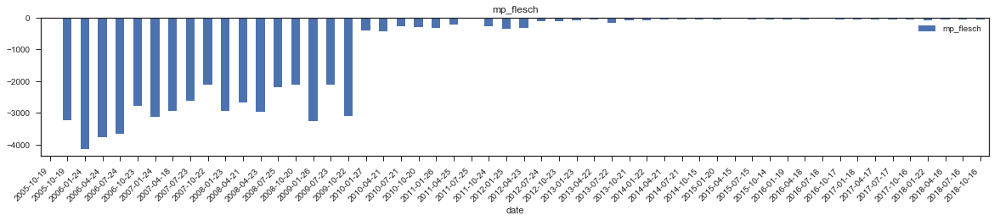

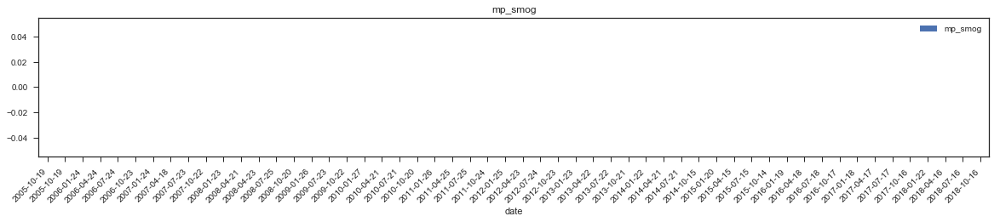

...

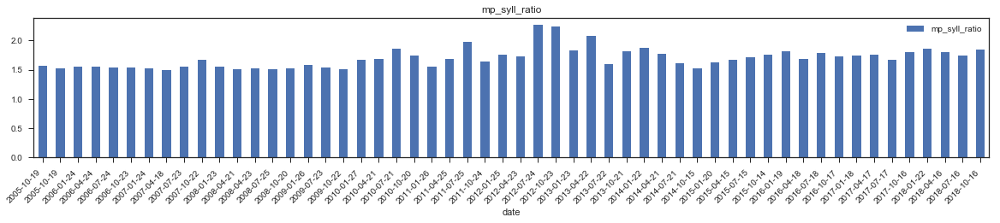

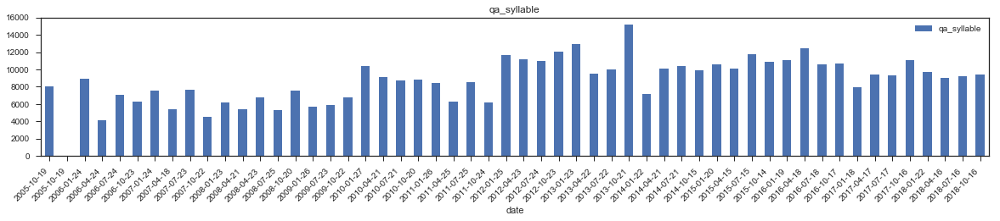

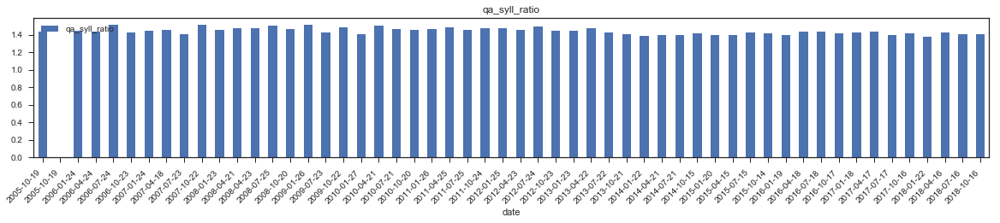

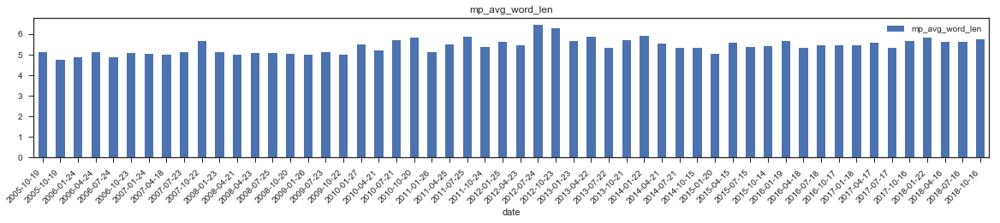

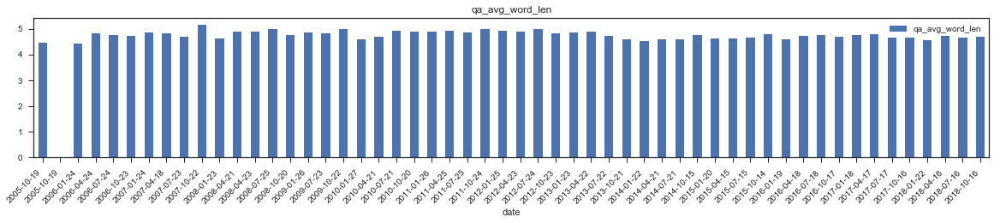

In [156]:
for column in list(clean_df.columns[5:]):
    date_mp_word_count=sorted_df[['date', column]]
    date_mp_word_count=date_mp_word_count.set_index('date')
    date_mp_word_count.plot(kind="bar", figsize=(20,3))
    # Set a title for the chart
    plt.title(column)
    plt.setp(plt.gca().get_xticklabels(), rotation=45, horizontalalignment='right')
    plt.show()  

In [17]:
#Calculates the difference of a DataFrame element compared with another element in the DataFrame 
#(default is the element in the same column of the previous row). Take out the return columns, add back
diff_df=clean_df.drop(['excess_return_1', 'excess_return_30', 'excess_return_60', 'excess_return_90', 'excess_return_180'], axis=1)
diff_df=diff_df.diff()
diff_df

,mp_word_count,qa_word_count,mp_coleman,mp_flesch,mp_smog,mp_kincaid,mp_automated,mp_dale_chall,mp_diff_words,mp_linsear,...,mp_numerics,mp_num_ratio,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-10-19,3188.0,-5618.0,-1.27,-3227.36,0.0,1242.1,1592.7,155.87,408.0,16.0,...,22.0,-0.006646,-15.0,NaN,4838.0,-0.043091,-8048.0,NaN,-0.385209,-4.457613
2006-01-24,899.0,6187.0,0.64,-912.48,0.0,350.6,450.1,44.51,96.0,10.0,...,27.0,0.004966,22.0,NaN,1481.0,0.027842,8922.0,NaN,0.113468,4.428483
2006-04-24,-371.0,-3349.0,0.75,376.56,0.0,-144.7,-184.9,-18.28,-19.0,-6.0,...,-33.0,-0.007533,-19.0,-0.002499,-562.0,0.003091,-4842.0,-0.004424,0.257201,0.401216
2006-07-24,-99.0,1818.0,-0.63,100.49,0.0,-38.6,-50.1,-5.04,-43.0,-8.0,...,5.0,0.001475,4.0,0.000446,-225.0,-0.019404,2947.0,0.071603,-0.243704,-0.070831
2006-10-23,-883.0,-295.0,0.52,896.24,0.0,-344.4,-441.0,-43.57,-70.0,2.0,...,-6.0,-0.000262,2.0,0.000560,-1344.0,0.002516,-795.0,-0.080205,0.208843,-0.049511
2007-01-24,342.0,871.0,-0.18,-347.13,0.0,133.4,170.8,16.96,47.0,4.0,...,15.0,0.004144,1.0,-0.000152,481.0,-0.013702,1323.0,0.014968,-0.049575,0.134848
2007-04-18,-181.0,-1536.0,-0.46,183.72,0.0,-70.6,-90.8,-9.21,-68.0,-2.0,...,-15.0,-0.004454,0.0,0.000794,-356.0,-0.027318,-2177.0,0.011088,-0.053126,-0.035472
2007-07-23,-312.0,1736.0,0.81,316.68,0.0,-121.6,-155.4,-15.20,7.0,3.0,...,-4.0,-0.000873,2.0,-0.000496,-317.0,0.055863,2275.0,-0.046213,0.135377,-0.137211


In [18]:
#reset the index to date for df_excess_returns, join with diff_df, drop duplicates, drop first row; 
df_excess_returns.set_index('date', inplace=True)
diff_two_df=diff_df.join(df_excess_returns, how='left')
diff_two_df=diff_two_df.drop_duplicates()
diff_two_df=diff_two_df.iloc[1:]
diff_two_df

,mp_word_count,qa_word_count,mp_coleman,mp_flesch,mp_smog,mp_kincaid,mp_automated,mp_dale_chall,mp_diff_words,mp_linsear,...,excess_return_1,excess_return_30,excess_return_60,excess_return_90,excess_return_180,excess_sign_plus180,excess_sign_plus90,excess_sign_plus60,excess_sign_plus30,excess_sign_plus1
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,3188.0,-5618.0,-1.27,-3227.36,0.0,1242.1,1592.7,155.87,408.0,16.0,...,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441,0,0,0,0,0
2006-01-24,899.0,6187.0,0.64,-912.48,0.0,350.6,450.1,44.51,96.0,10.0,...,0.1547,0.0192,0.1403,0.2282,-0.0369,0,1,1,1,1
2006-04-24,-371.0,-3349.0,0.75,376.56,0.0,-144.7,-184.9,-18.28,-19.0,-6.0,...,0.0182,-0.0694,-0.0754,-0.2035,-0.3113,0,0,0,0,1
2006-07-24,-99.0,1818.0,-0.63,100.49,0.0,-38.6,-50.1,-5.04,-43.0,-8.0,...,-0.2132,-0.2419,-0.0733,-0.1178,-0.2064,0,0,0,0,0
2006-10-23,-883.0,-295.0,0.52,896.24,0.0,-344.4,-441.0,-43.57,-70.0,2.0,...,0.1829,0.2570,0.1113,-0.0868,-0.1355,0,0,1,1,1
2007-01-24,342.0,871.0,-0.18,-347.13,0.0,133.4,170.8,16.96,47.0,4.0,...,0.0337,0.0249,0.0276,-0.0787,-0.3105,0,0,1,1,1
2007-04-18,-181.0,-1536.0,-0.46,183.72,0.0,-70.6,-90.8,-9.21,-68.0,-2.0,...,-0.0085,-0.0252,-0.1156,-0.1195,0.0515,1,0,0,0,0
2007-07-23,-312.0,1736.0,0.81,316.68,0.0,-121.6,-155.4,-15.20,7.0,3.0,...,-0.0522,0.0568,0.1242,0.3547,0.4382,1,1,1,1,0
2007-10-22,-529.0,-2478.0,2.84,520.01,0.0,-204.0,-262.2,-25.32,48.0,4.0,...,0.1214,-0.0046,0.2372,0.0978,0.7884,1,1,1,0,1


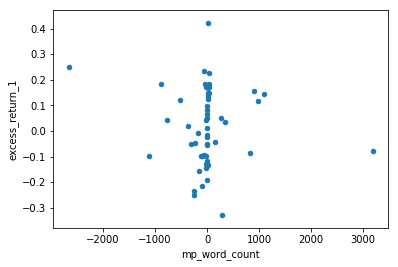

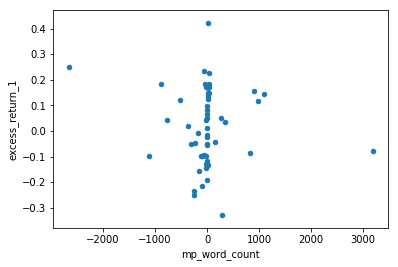

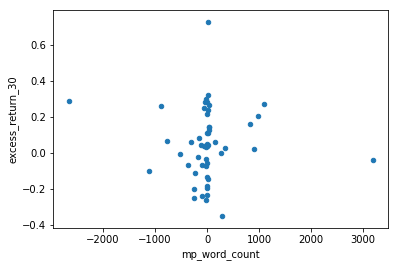

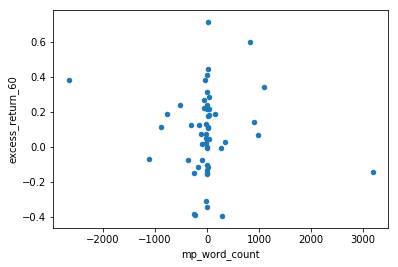

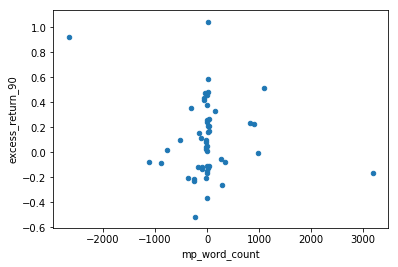

...

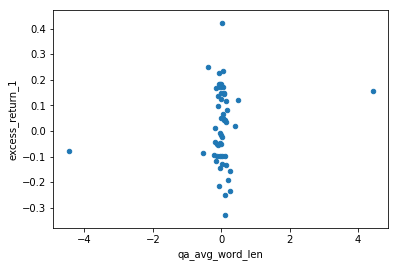

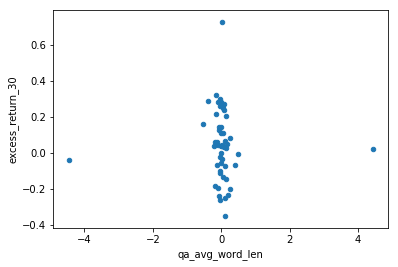

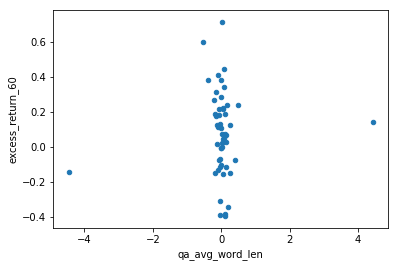

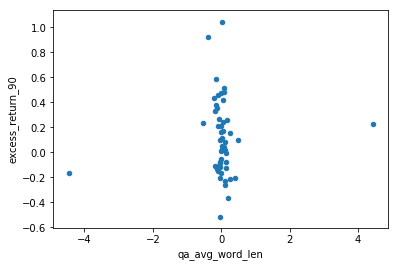

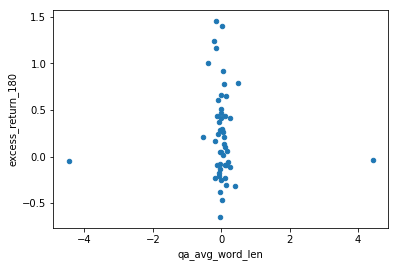

In [20]:
#plot the differences dataframe vs excess returns
import matplotlib.pyplot as plt
for column in list(diff_two_df.columns[:42]):
    for col2 in list(diff_two_df.columns[42:47]):
        diff_two_df.plot(kind='scatter', x=column, y=col2)
        plt.show()

In [65]:
#apply MinMaxScaler to specifice columns in the differences dataframe ; also:StandardScaler(), RobustScaler(), Normalizer()
from sklearn.preprocessing import MinMaxScaler
dfTest = diff_two_df.copy()
scaler = MinMaxScaler()
dfTest[['qa_word_count']] = scaler.fit_transform(diff_two_df[['qa_word_count']])
dfTest[['excess_return_60']] = scaler.fit_transform(diff_two_df[['excess_return_60']])
dfTest

,mp_word_count,qa_word_count,mp_coleman,mp_flesch,mp_smog,mp_kincaid,mp_automated,mp_dale_chall,mp_diff_words,mp_linsear,...,excess_return_1,excess_return_30,excess_return_60,excess_return_90,excess_return_180,excess_sign_plus180,excess_sign_plus90,excess_sign_plus60,excess_sign_plus30,excess_sign_plus1
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,3188.0,0.002451,-1.27,-3227.36,0.0,1242.1,1592.7,155.87,408.0,16.0,...,-0.0783,-0.0422,0.225597,-0.1628,-0.0441,0,0,0,0,0
2006-01-24,899.0,1.000000,0.64,-912.48,0.0,350.6,450.1,44.51,96.0,10.0,...,0.1547,0.0192,0.483461,0.2282,-0.0369,0,1,1,1,1
2006-04-24,-371.0,0.194186,0.75,376.56,0.0,-144.7,-184.9,-18.28,-19.0,-6.0,...,0.0182,-0.0694,0.289049,-0.2035,-0.3113,0,0,0,0,1
2006-07-24,-99.0,0.630810,-0.63,100.49,0.0,-38.6,-50.1,-5.04,-43.0,-8.0,...,-0.2132,-0.2419,0.290942,-0.1178,-0.2064,0,0,0,0,0
2006-10-23,-883.0,0.452256,0.52,896.24,0.0,-344.4,-441.0,-43.57,-70.0,2.0,...,0.1829,0.2570,0.457323,-0.0868,-0.1355,0,0,1,1,1
2007-01-24,342.0,0.550786,-0.18,-347.13,0.0,133.4,170.8,16.96,47.0,4.0,...,0.0337,0.0249,0.381884,-0.0787,-0.3105,0,0,1,1,1
2007-04-18,-181.0,0.347389,-0.46,183.72,0.0,-70.6,-90.8,-9.21,-68.0,-2.0,...,-0.0085,-0.0252,0.252817,-0.1195,0.0515,1,0,0,0,0
2007-07-23,-312.0,0.623880,0.81,316.68,0.0,-121.6,-155.4,-15.20,7.0,3.0,...,-0.0522,0.0568,0.468950,0.3547,0.4382,1,1,1,1,0
2007-10-22,-529.0,0.267788,2.84,520.01,0.0,-204.0,-262.2,-25.32,48.0,4.0,...,0.1214,-0.0046,0.570798,0.0978,0.7884,1,1,1,0,1


In [72]:
#scale the diff df (doesn't have the returns attached), first must deal with NaNs...
diff_df.fillna(diff_df.mean(), inplace=True)#can fill with 0, '', etc...this fills with mean of that column
df_scaled = pd.DataFrame(scaler.fit_transform(diff_df), columns=diff_df.columns, index=diff_df.index)
df_scaled=df_scaled.iloc[1:]#drop first row as is duplicate and not valid as a difference value (no previous obervation to compare it with)
df_scaled

,mp_word_count,qa_word_count,mp_coleman,mp_flesch,mp_smog,mp_kincaid,mp_automated,mp_dale_chall,mp_diff_words,mp_linsear,...,mp_numerics,mp_num_ratio,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,1.000000,0.002451,0.401588,0.000000,0.0,1.000000,1.000000,1.000000,1.000000,0.754098,...,0.916667,0.431989,0.253012,0.412268,1.000000,0.428259,0.000000,0.445180,0.187482,0.000000
2006-01-24,0.608651,1.000000,0.509926,0.391599,0.0,0.608562,0.608779,0.610480,0.580645,0.655738,...,1.000000,0.553264,0.698795,0.412268,0.616956,0.496905,1.000000,0.445180,0.481914,1.000000
2006-04-24,0.391520,0.194186,0.516166,0.609660,0.0,0.391087,0.391358,0.390850,0.426075,0.393443,...,0.000000,0.422725,0.204819,0.181440,0.383843,0.472953,0.188922,0.425653,0.566777,0.546790
2006-07-24,0.438024,0.630810,0.437890,0.562958,0.0,0.437673,0.437513,0.437161,0.393817,0.360656,...,0.633333,0.516806,0.481928,0.455992,0.422296,0.451183,0.647908,0.818606,0.271030,0.493668
2006-10-23,0.303984,0.452256,0.503120,0.697572,0.0,0.303403,0.303670,0.302389,0.357527,0.524590,...,0.450000,0.498660,0.457831,0.466615,0.294614,0.472396,0.427401,0.033970,0.538226,0.496067
2007-01-24,0.513421,0.550786,0.463415,0.487236,0.0,0.513194,0.513148,0.514114,0.514785,0.557377,...,0.800000,0.544681,0.445783,0.400171,0.502853,0.456701,0.552210,0.525884,0.385649,0.516814
2007-04-18,0.424004,0.347389,0.447533,0.577038,0.0,0.423622,0.423577,0.422575,0.360215,0.459016,...,0.300000,0.454883,0.433735,0.488429,0.407348,0.443524,0.345963,0.505828,0.383552,0.497647
2007-07-23,0.401607,0.623880,0.519569,0.599530,0.0,0.401229,0.401459,0.401623,0.461022,0.540984,...,0.483333,0.492281,0.457831,0.368096,0.411798,0.524023,0.608309,0.209661,0.494849,0.486198
2007-10-22,0.364507,0.267788,0.634714,0.633927,0.0,0.365049,0.364891,0.366225,0.516129,0.557377,...,0.483333,0.493491,0.373494,0.429347,0.383044,0.583524,0.287095,1.000000,0.723640,0.556952


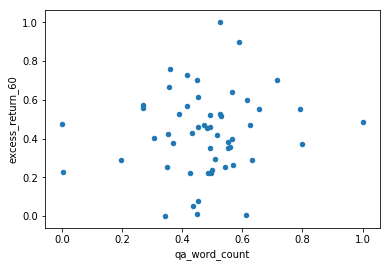

In [57]:
#scatterplot post MinMaxScaler, both x and y variable scaled..
dfTest.plot(kind='scatter', x='qa_word_count', y='excess_return_60')
plt.show()

In [46]:
#beginning of handling outliers
low = .05
high = .96
quant_df = diff_two_df.quantile([low, high])
print(quant_df)

      mp_word_count  qa_word_count  mp_coleman  mp_flesch  mp_smog  \
0.05        -816.40        -2826.4     -4.4600  -941.7160      0.0   
0.96         965.24         3645.8      4.4376   887.2272      0.0   

      mp_kincaid  mp_automated  mp_dale_chall  mp_diff_words  mp_linsear  \
0.05     -318.42      -408.060       -40.5400         -87.20       -8.00   
0.96      376.36       482.024        47.5552          96.92        9.88   

            ...          mp_syll_ratio  qa_syllable  qa_syll_ratio  \
0.05        ...              -0.254111     -3956.40      -0.071142   
0.96        ...               0.243542      5070.68       0.071603   

      mp_avg_word_len  qa_avg_word_len  excess_return_1  excess_return_30  \
0.05        -0.530127        -0.282481        -0.220960         -0.246580   
0.96         0.520847         0.388681         0.233428          0.296524   

      excess_return_60  excess_return_90  excess_return_180  
0.05         -0.359120         -0.240710            -0.

In [47]:
#apply the quantile filtering 
#first take out the columns that are not in the quant_df
filt_df = diff_two_df.loc[:, ~diff_two_df.columns.isin(['excess_sign_plus1', 'excess_sign_plus30', 'excess_sign_plus60', 'excess_sign_plus90', 'excess_sign_plus180'])]
#apply the filter,just keeping the data in between the ranges, axis=0 applies it by column
filt_df = filt_df.apply(lambda x: x[(x>quant_df.loc[low,x.name]) & (x < quant_df.loc[high,x.name])], axis=0)
#bring back the dropped columns
filt_df = pd.concat([diff_two_df.loc[:,['excess_sign_plus1', 'excess_sign_plus30', 'excess_sign_plus60', 'excess_sign_plus90', 'excess_sign_plus180']], filt_df], axis=1)
#there will be nan's as where the data did not meet the quantile filters; i.e. rows/observations are not dropped!


In [50]:
filt_df

,excess_sign_plus1,excess_sign_plus30,excess_sign_plus60,excess_sign_plus90,excess_sign_plus180,mp_word_count,qa_word_count,mp_coleman,mp_flesch,mp_smog,...,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len,excess_return_1,excess_return_30,excess_return_60,excess_return_90,excess_return_180
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,0,0,0,0,0,NaN,NaN,-1.27,NaN,NaN,...,-0.043091,NaN,NaN,-0.385209,NaN,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441
2006-01-24,1,1,1,1,0,899.0,NaN,0.64,-912.48,NaN,...,0.027842,NaN,NaN,0.113468,NaN,0.1547,0.0192,0.1403,0.2282,-0.0369
2006-04-24,1,0,0,0,0,-371.0,NaN,0.75,376.56,NaN,...,0.003091,NaN,-0.004424,0.257201,NaN,0.0182,-0.0694,-0.0754,-0.2035,-0.3113
2006-07-24,0,0,0,0,0,-99.0,1818.0,-0.63,100.49,NaN,...,-0.019404,2947.0,NaN,-0.243704,-0.070831,-0.2132,-0.2419,-0.0733,-0.1178,-0.2064
2006-10-23,1,1,1,0,0,NaN,-295.0,0.52,NaN,NaN,...,0.002516,-795.0,NaN,0.208843,-0.049511,0.1829,0.2570,0.1113,-0.0868,-0.1355
2007-01-24,1,1,1,0,0,342.0,871.0,-0.18,-347.13,NaN,...,-0.013702,1323.0,0.014968,-0.049575,0.134848,0.0337,0.0249,0.0276,-0.0787,-0.3105
2007-04-18,0,0,0,0,1,-181.0,-1536.0,-0.46,183.72,NaN,...,-0.027318,-2177.0,0.011088,-0.053126,-0.035472,-0.0085,-0.0252,-0.1156,-0.1195,0.0515
2007-07-23,0,1,1,1,1,-312.0,1736.0,0.81,316.68,NaN,...,0.055863,2275.0,-0.046213,0.135377,-0.137211,-0.0522,0.0568,0.1242,0.3547,0.4382
2007-10-22,1,0,1,1,1,-529.0,-2478.0,2.84,520.01,NaN,...,0.117346,-3176.0,NaN,NaN,NaN,0.1214,-0.0046,0.2372,0.0978,0.7884


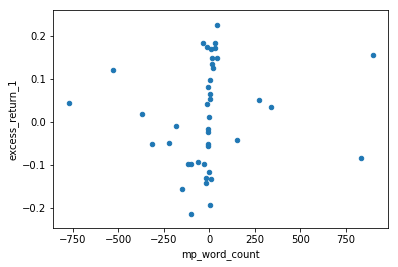

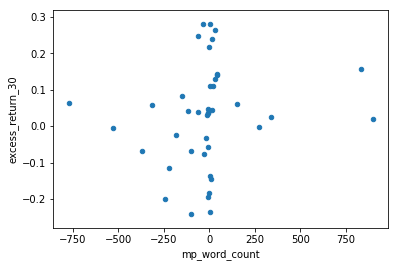

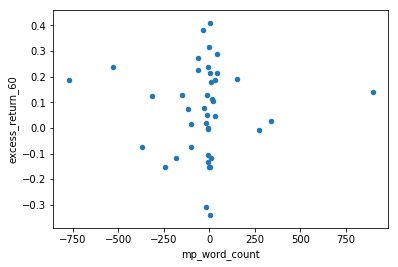

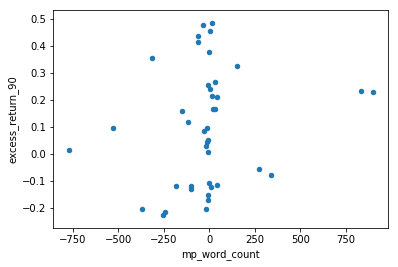

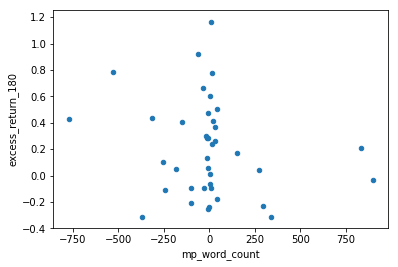

...

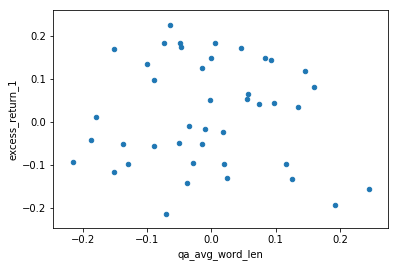

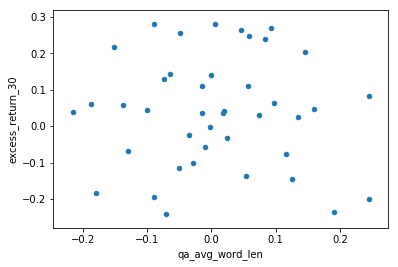

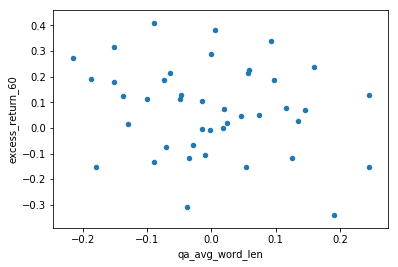

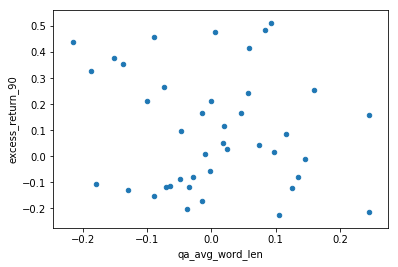

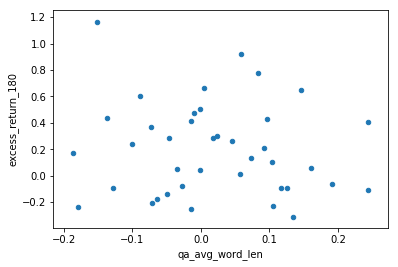

In [61]:
#scatter plots of the outlier filtered data...
for column in list(filt_df.columns[5:47]):
    for col2 in list(filt_df.columns[47:]):
        filt_df.plot(kind='scatter', x=column, y=col2)
        plt.show()


Machine Learning 

In [191]:
ml_df=newer_df.drop(['url', 'data', 'datetag', 'ticker', 'nparts', 'QA','MP'], axis=1)
ml_df

,excess_return_1,excess_return_30,excess_return_60,excess_return_90,excess_return_180,excess_sign_plus180,excess_sign_plus90,excess_sign_plus60,excess_sign_plus30,excess_sign_plus1,...,qa_numerics,qa_num_ratio,mp_syllable,mp_syll_ratio,qa_syllable,qa_syll_ratio,mp_avg_word_len,qa_avg_word_len,clean_mp,clean_qa
date,,,,,,,,,,,,,,,,,,,,,
2005-10-19,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441,0,0,0,0,0,...,15,0.002670,114,1.561644,8048,1.432538,5.135135,4.457613,entire text q netflix ticker nflx q conference...,question answer session operator question answ...
2005-10-19,-0.0783,-0.0422,-0.1458,-0.1628,-0.0441,0,0,0,0,0,...,0,NaN,4952,1.518553,0,NaN,4.749926,0.000000,entire text prepared remarks netflix ticker nf...,
2006-01-24,0.1547,0.0192,0.1403,0.2282,-0.0369,0,1,1,1,1,...,22,0.003556,6433,1.546394,8922,1.442056,4.863394,4.428483,netflix nasdaq nflx q earnings conference call...,conducted electronically like ask question ple...
2006-04-24,0.0182,-0.0694,-0.0754,-0.2035,-0.3113,0,0,0,0,1,...,3,0.001057,5871,1.549485,4080,1.437632,5.120595,4.829699,netflix inc nasdaq nflx q earnings conference ...,question answer sessionoperatorthank today que...
2006-07-24,-0.2132,-0.2419,-0.0733,-0.1178,-0.2064,0,0,0,0,0,...,7,0.001503,5646,1.530081,7027,1.509235,4.876891,4.758868,sponsor seeking alpha transcript click july pm...,question answer sessionoperatorour first quest...
2006-10-23,0.1829,0.2570,0.1113,-0.0868,-0.1355,0,0,1,1,1,...,9,0.002064,4302,1.532597,6232,1.429030,5.085734,4.709357,sponsor seeking alpha transcript click october...,question answer sessionoperator operator instr...
2007-01-24,0.0337,0.0249,0.0276,-0.0787,-0.3105,0,0,1,1,1,...,10,0.001911,4783,1.518895,7555,1.443998,5.036160,4.844205,sponsor seeking alpha transcript click january...,question answer sessionoperator operator instr...
2007-04-18,-0.0085,-0.0252,-0.1156,-0.1195,0.0515,1,0,0,0,0,...,10,0.002706,4427,1.491577,5378,1.455087,4.983034,4.808733,sponsor seeking alpha transcript click april e...,question answer sessionoperatorwe take first q...
2007-07-23,-0.0522,0.0568,0.1242,0.3547,0.4382,1,1,1,1,0,...,12,0.002209,4110,1.547440,7653,1.408873,5.118411,4.671522,netflix inc nasdaq nflx q earnings call july p...,question answer sessionoperator operator instr...


In [187]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

In [201]:
#Once data is loaded, create ‘y’ variable, which is the label or outcome you want the label to learn…
#fit: Learn a vocabulary dictionary of all tokens in the raw documents.
#transform: Transform documents to document-term matrix.
y=ml_df['excess_sign_plus60']  
X_train, X_test, y_train, y_test = train_test_split(ml_df['clean_mp'], y, test_size=0.33, 
                                           random_state=53)
count_vectorizer=CountVectorizer(stop_words='english')
count_train = count_vectorizer.fit_transform(X_train.values)
count_test = count_vectorizer.transform(X_test.values)

In [204]:
print(count_vectorizer.get_feature_names()[:10])

['abigger', 'ability', 'able', 'abr', 'absolute', 'absorb', 'absorbed', 'abuzz', 'accelerate', 'accelerated']


In [205]:
#CountVectorizer=Tokenize the documents and count the occurrences of token and return them as a sparse matrix
#TfidfTransformer=Apply Term Frequency Inverse Document Frequency normalization to a sparse matrix of occurrence counts.
#TfidfVectorizer Equivalent to CountVectorizer followed by TfidfTransformer.

# Import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize a TfidfVectorizer object: tfidf_vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.7)

# Transform the training data: tfidf_train 
tfidf_train = tfidf_vectorizer.fit_transform(X_train)

# Transform the test data: tfidf_test 
tfidf_test = tfidf_vectorizer.transform(X_test)

# Print the first 10 features
print(tfidf_vectorizer.get_feature_names()[:10])

# Print the first 5 vectors of the tfidf training data
print(tfidf_train.A[:5])

['abigger', 'ability', 'able', 'abr', 'absolute', 'absorb', 'absorbed', 'abuzz', 'accelerate', 'accelerated']
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.03537408  0.00969841 ...,  0.01235395  0.          0.        ]]


In [214]:
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
nb_classifier = MultinomialNB()
nb_classifier.fit(count_train, y_train)
pred = nb_classifier.predict(count_test)
print("Test Score: {:3f}".format(metrics.accuracy_score(y_test, pred)))

Test Score: 0.777778


In [217]:
cm = metrics.confusion_matrix(y_test, pred)
print(cm)

[[ 2  4]
 [ 0 12]]


In [218]:
#To get a better idea of how the vectors work, you'll investigate them by converting them into pandas DataFrames
# Create the CountVectorizer DataFrame: 
count_df = pd.DataFrame(count_train.A, columns=count_vectorizer.get_feature_names())

# Create the TfidfVectorizer DataFrame: 
tfidf_df = pd.DataFrame(tfidf_train.A, columns=tfidf_vectorizer.get_feature_names())

# Print the head of count_df
print(count_df.head())

# Print the head of tfidf_df
print(tfidf_df.head())

   abigger  ability  able  abr  absolute  absorb  absorbed  abuzz  accelerate  \
0        0        0     0    0         0       0         0      0           0   
1        0        0     0    0         0       0         0      0           0   
2        0        0     0    0         0       0         0      0           0   
3        0        0     0    1         0       0         0      0           0   
4        0        4     1    0         0       0         1      0           1   

   accelerated   ...     xbox  yahoo  year  years  yearto  younger  \
0            0   ...        0      0     0      0       0        0   
1            0   ...        0      0     0      0       0        0   
2            0   ...        0      0     0      0       0        0   
3            0   ...        0      0     0      0       0        0   
4            1   ...        0      0    36     10       0        0   

   youngergeneration  youssef  youtube  youwith  
0                  0        0        0    

In [219]:
# Calculate the difference in columns: 
difference = set(count_df.columns) - set(tfidf_df.columns)
print(difference)

# Check whether the DataFrames are equal
print(count_df.equals(tfidf_df))

{'quarter', 'conference', 'looking', 'earnings', 'founder', 'forward', 'pm', 'statements', 'hastings', 'company', 'results', 'netflix', 'reed', 'financial', 'today', 'nasdaq', 'actual', 'officer', 'nflx', 'ceo', 'chief'}
False


In [220]:
#Now that you have evaluated the model using the CountVectorizer, you'll do the same using the TfidfVectorizer
# Create a Multinomial Naive Bayes classifier: 
nb_classifier = MultinomialNB()

# Fit the classifier to the training data
nb_classifier.fit(tfidf_train, y_train)

# Create the predicted tags: 
pred = nb_classifier.predict(tfidf_test)

# Calculate the accuracy score: 
score = metrics.accuracy_score(y_test, pred)
print(score)


0.666666666667


In [221]:
cm = metrics.confusion_matrix(y_test, pred)
print(cm)

[[ 0  6]
 [ 0 12]]


In [223]:
import numpy as np
# Create the list of alphas: alphas
alphas = np.arange(0, 1, .1)

# Define train_and_predict()
def train_and_predict(alpha):
    # Instantiate the classifier:
    nb_classifier = 	MultinomialNB(alpha=alpha)
    # Fit to the training data
    nb_classifier.fit(tfidf_train, y_train)
    # Predict the labels: pred
    pred = nb_classifier.predict(tfidf_test)
    # Compute accuracy: 
    score = metrics.accuracy_score(y_test, pred)
    return score


In [224]:
# Iterate over the alphas and print the corresponding score
for alpha in alphas:
    print('Alpha: ', alpha)
    print('Score: ', train_and_predict(alpha))
    print()

Alpha:  0.0
Score:  0.666666666667

Alpha:  0.1
Score:  0.722222222222

Alpha:  0.2
Score:  0.666666666667

Alpha:  0.3
Score:  0.666666666667

Alpha:  0.4
Score:  0.666666666667

Alpha:  0.5
Score:  0.666666666667

Alpha:  0.6
Score:  0.666666666667

Alpha:  0.7
Score:  0.666666666667

Alpha:  0.8
Score:  0.666666666667

Alpha:  0.9
Score:  0.666666666667



/Users/forrestbadgley/anaconda3/lib/python3.6/site-packages/sklearn/naive_bayes.py:472: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  'setting alpha = %.1e' % _ALPHA_MIN)


In [225]:
#investigate what it has learned. You can map the important vector weights back to actual 
#words using some simple inspection techniques
# Get the class labels: class_labels
class_labels = nb_classifier.classes_

# Extract the features: 
feature_names = tfidf_vectorizer.get_feature_names()

# Zip the feature names together with the coefficient array and sort by weights: 
feat_with_weights = sorted(zip(nb_classifier.coef_[0], feature_names))

# Print the first class label and the top 20 feat_with_weights entries
print(class_labels[0], feat_with_weights[:20])

# Print the second class label and the bottom 20 feat_with_weights entries
print(class_labels[1], feat_with_weights[-20:])

0 [(-8.0587547266048016, 'absorbed'), (-8.0587547266048016, 'achieved'), (-8.0587547266048016, 'achievement'), (-8.0587547266048016, 'acquired'), (-8.0587547266048016, 'acquiring'), (-8.0587547266048016, 'actively'), (-8.0587547266048016, 'adjustments'), (-8.0587547266048016, 'adopted'), (-8.0587547266048016, 'ads'), (-8.0587547266048016, 'advisor'), (-8.0587547266048016, 'agnostic'), (-8.0587547266048016, 'agnostically'), (-8.0587547266048016, 'agreements'), (-8.0587547266048016, 'airline'), (-8.0587547266048016, 'algorithm'), (-8.0587547266048016, 'algorithmic'), (-8.0587547266048016, 'allow'), (-8.0587547266048016, 'allowing'), (-8.0587547266048016, 'amazing'), (-8.0587547266048016, 'amil')]
1 [(-7.3869320519647159, 'ted'), (-7.3856365853458943, 'morgan'), (-7.3823336757268878, 'online'), (-7.3808073325426848, 'david'), (-7.3744778973222962, 'dvd'), (-7.3711127102133407, 'doug'), (-7.3543394709073606, 'mitchelson'), (-7.3533814700927795, 'president'), (-7.3420489429631361, 'ben'), (